<a href="https://colab.research.google.com/github/JVR27XD/MobileSAM/blob/main/Fine_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# 📁 1. Montar Google Drive y definir rutas
from google.colab import drive
drive.mount('/content/drive')

RUTA_PROYECTO = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI"
LABELED_DIR = f"{RUTA_PROYECTO}/Labeled"
CHECKPOINTS_DIR = f"{RUTA_PROYECTO}/checkpoints"

import os
os.makedirs(CHECKPOINTS_DIR, exist_ok=True)


Mounted at /content/drive


In [2]:
import os
os.makedirs("/content/drive/MyDrive/Colab Notebooks/SolDef_AI", exist_ok=True)


In [3]:
# 📦 2. Clonar Segment Anything Model (SAM)
!git clone https://github.com/facebookresearch/segment-anything.git
%cd segment-anything

Cloning into 'segment-anything'...
remote: Enumerating objects: 304, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 304 (delta 2), reused 2 (delta 2), pack-reused 299 (from 2)
Receiving objects: 100% (304/304), 18.31 MiB | 12.82 MiB/s, done.
Resolving deltas: 100% (159/159), done.
/content/segment-anything


In [4]:
checkpoint_path = f"{CHECKPOINTS_DIR}/sam_vit_b.pth"

if not os.path.exists(checkpoint_path):
    !wget -O "$checkpoint_path" https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth


In [5]:
import os

CHECKPOINTS_DIR = "/content/checkpoints"
os.makedirs(CHECKPOINTS_DIR, exist_ok=True)

checkpoint_path = f"{CHECKPOINTS_DIR}/sam_vit_b.pth"

if not os.path.exists(checkpoint_path):
    !wget -O "$checkpoint_path" https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
else:
    print(f"✅ Checkpoint ya existe en: {checkpoint_path}")


--2025-08-01 14:35:57--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 108.157.254.124, 108.157.254.15, 108.157.254.102, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|108.157.254.124|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375042383 (358M) [binary/octet-stream]
Saving to: ‘/content/checkpoints/sam_vit_b.pth’

/content/checkpoint 100%[===================>] 357.67M   279MB/s    in 1.3s    

2025-08-01 14:35:59 (279 MB/s) - ‘/content/checkpoints/sam_vit_b.pth’ saved [375042383/375042383]



In [6]:
# 🧠 4. Cargar modelo SAM
import torch
from segment_anything import sam_model_registry

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
sam = sam_model_registry['vit_b'](checkpoint=checkpoint_path)

sam.to(device=DEVICE)
sam.train()



Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d()
    )


In [7]:
# 🧾 5. Función para generar máscaras desde JSON
import json
import numpy as np
from PIL import Image, ImageDraw

def mask_from_json(json_path, original_size, target_size=(1024, 1024)):
    import json
    from PIL import Image, ImageDraw

    with open(json_path) as f:
        data = json.load(f)

    # Escala entre imagen original y máscara final
    scale_x = target_size[0] / original_size[0]
    scale_y = target_size[1] / original_size[1]

    mask = Image.new("L", target_size, 0)
    draw = ImageDraw.Draw(mask)

    for shape in data.get("shapes", []):
        if shape["shape_type"] == "polygon":
            scaled_polygon = [
                (x * scale_x, y * scale_y) for x, y in shape["points"]
            ]
            draw.polygon(scaled_polygon, outline=1, fill=1)

    return mask



In [8]:
import os
import json
from PIL import Image
import numpy as np
import torch
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
import cv2
import glob

class PCBDefectDataset(Dataset):
    def __init__(self, img_dir, json_dir, transform_image=None, transform_mask=None):
        self.img_dir = img_dir
        self.json_dir = json_dir
        self.transform_image = transform_image or ToTensor()
        self.transform_mask = transform_mask or ToTensor()

        # Buscar todas las imágenes .jpg recursivamente
        self.img_paths = glob.glob(os.path.join(img_dir, "**", "*.jpg"), recursive=True)

        # Filtrar las que tienen su .json correspondiente
        self.img_paths = [p for p in self.img_paths
                          if os.path.exists(os.path.join(json_dir, os.path.basename(p).replace(".jpg", ".json")))]

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        filename = os.path.basename(img_path)

        # Cargar imagen
        image = Image.open(img_path).convert("RGB")
        width, height = image.size

        # Inicializar máscara vacía
        mask = np.zeros((height, width), dtype=np.uint8)

        # Cargar anotación y dibujar máscara
        json_path = os.path.join(self.json_dir, filename.replace(".jpg", ".json"))
        if os.path.exists(json_path):
            with open(json_path, 'r') as f:
                data = json.load(f)
                for shape in data['shapes']:
                    if shape['shape_type'] == 'polygon':
                        points = np.array(shape['points'], dtype=np.int32)
                        cv2.fillPoly(mask, [points], color=1)

        # Convertir a tensores
        image = self.transform_image(image)
        mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)

        return image, mask





In [9]:
IMG_DIR = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI/Dataset"
JSON_DIR = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI/Labeled"

dataset = PCBDefectDataset(IMG_DIR, JSON_DIR)
print(f"Total ejemplos: {len(dataset)}")
img, mask = dataset[0]
print("Image shape:", img.shape)
print("Mask shape:", mask.shape)



Total ejemplos: 428
Image shape: torch.Size([3, 1440, 2560])
Mask shape: torch.Size([1, 1440, 2560])


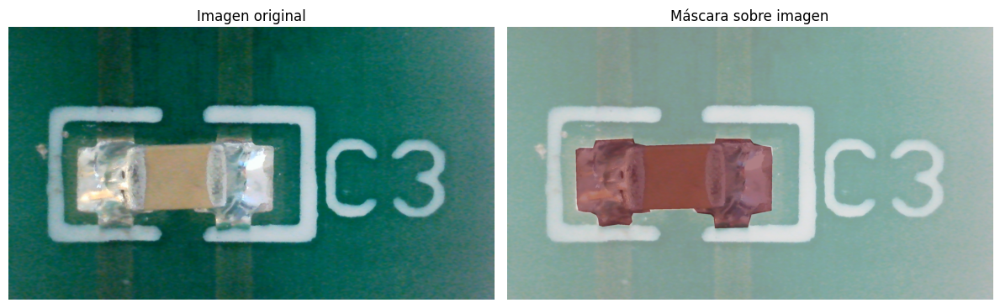

In [10]:
import matplotlib.pyplot as plt

def mostrar_ejemplo(dataset, idx=0):
    img, mask = dataset[idx]

    # Convertir imagen y máscara a numpy
    img_np = img.permute(1, 2, 0).numpy()
    mask_np = mask.squeeze().numpy()

    plt.figure(figsize=(12, 6))

    # Imagen original
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.title("Imagen original")
    plt.axis("off")

    # Imagen con máscara superpuesta
    plt.subplot(1, 2, 2)
    plt.imshow(img_np)
    plt.imshow(mask_np, alpha=0.5, cmap='Reds')
    plt.title("Máscara sobre imagen")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Visualizar uno
mostrar_ejemplo(dataset, idx=0)



In [11]:
from torch.utils.data import DataLoader

batch_size = 32  # Puedes aumentarlo si tienes suficiente memoria
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)



In [12]:
# Congelar todos los parámetros primero
for param in sam.parameters():
    param.requires_grad = False

# Descongelar solo el decoder de máscaras
for param in sam.mask_decoder.parameters():
    param.requires_grad = True


In [13]:
import torch.nn as nn
import torch.optim as optim

criterion = nn.BCELoss()
optimizer = optim.Adam(sam.mask_decoder.parameters(), lr=1e-4)



In [14]:
import matplotlib.pyplot as plt
from segment_anything.modeling import Sam
from torch.nn.functional import interpolate
import pandas as pd
import torch
import numpy as np

def train_sam_decoder(sam: Sam, dataloader, epochs=5, lr=1e-4, device="cuda"):
    for param in sam.parameters():
        param.requires_grad = False
    for param in sam.mask_decoder.parameters():
        param.requires_grad = True

    optimizer = torch.optim.Adam(sam.mask_decoder.parameters(), lr=lr)
    criterion = torch.nn.BCELoss()
    sam.to(device)
    sam.train()

    metrics_log = []

    for epoch in range(epochs):
        print(f"\n🔁 Epoch {epoch+1}/{epochs}")
        total_loss = 0.0

        for i, (images, masks_gt) in enumerate(dataloader):
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image = images[b].unsqueeze(0)
                mask_gt = masks_gt[b]

                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue
                point = coords.float().mean(dim=0)

                # ✅ Prompt en el formato correcto: (1, 1, 2)
                point_coords = point.unsqueeze(0).unsqueeze(0).to(dtype=torch.float32, device=device)
                point_labels = torch.tensor([[1]], dtype=torch.int, device=device)

                # === Resize imagen a 1024x1024 antes de encoder ===
                image_resized = interpolate(image, size=(1024, 1024), mode="bilinear", align_corners=False)

                # === Paso por encoder SAM ===
                with torch.no_grad():
                    image_embedding = sam.image_encoder(image_resized)

                sparse_embeddings, dense_embeddings = sam.prompt_encoder(
                    points=(point_coords, point_labels),
                    boxes=None,
                    masks=None,
                )

                low_res_logits, _ = sam.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_tensor = interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")

                loss = criterion(mask_pred_tensor, mask_gt.unsqueeze(0))

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                total_loss += loss.item()

                ultima_image = image[0].permute(1, 2, 0).detach().cpu().numpy()
                ultima_gt = mask_gt[0].detach().cpu().numpy()
                ultima_pred = mask_pred_tensor[0, 0].detach().cpu().numpy()

            if i % 10 == 0:
                print(f"  [Batch {i}/{len(dataloader)}] Loss: {loss.item():.4f}")

        avg_loss = total_loss / len(dataloader)
        print(f"✅ Epoch {epoch+1} finished. Avg Loss: {avg_loss:.4f}")

        pred_bin = (mask_pred_tensor > 0.5).float()
        gt_bin = (mask_gt.unsqueeze(0) > 0.5).float()

        intersection = (pred_bin * gt_bin).sum().item()
        union = (pred_bin + gt_bin).clamp(0, 1).sum().item()
        pred_sum = pred_bin.sum().item()
        gt_sum = gt_bin.sum().item()

        iou = intersection / (union + 1e-7)
        dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
        precision = intersection / (pred_sum + 1e-7)
        recall = intersection / (gt_sum + 1e-7)

        print(f"📊 Métricas — IoU: {iou:.4f} | Dice: {dice:.4f} | Prec: {precision:.4f} | Rec: {recall:.4f}")

        metrics_log.append({
            "epoch": epoch + 1,
            "loss": avg_loss,
            "iou": iou,
            "dice": dice,
            "precision": precision,
            "recall": recall
        })

        mostrar_prediccion(ultima_image, ultima_gt, ultima_pred)

        decoder_path = f"sam_decoder_epoch{epoch+1}.pth"
        torch.save(sam.mask_decoder.state_dict(), decoder_path)
        print(f"💾 Decoder guardado: {decoder_path}")

    df = pd.DataFrame(metrics_log)
    df.to_csv("sam_decoder_metrics.csv", index=False)
    print("📁 Métricas guardadas en 'sam_decoder_metrics.csv'")

    graficar_metricas(df)


def mostrar_prediccion(image, gt_mask, pred_mask):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Imagen")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask, cmap="gray")
    plt.title("Máscara GT")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap="Reds")
    plt.title("Predicción")

    plt.tight_layout()
    plt.show()


def graficar_metricas(df):
    plt.figure(figsize=(12, 8))
    for i, metric in enumerate(["loss", "iou", "dice", "precision", "recall"]):
        plt.subplot(2, 3, i + 1)
        plt.plot(df["epoch"], df[metric], marker="o")
        plt.title(metric.capitalize())
        plt.xlabel("Epoch")
        plt.grid(True)

    plt.tight_layout()
    plt.show()










🔁 Epoch 1/20
  [Batch 0/14] Loss: 0.1519
  [Batch 10/14] Loss: 0.0348
✅ Epoch 1 finished. Avg Loss: 3.0081
📊 Métricas — IoU: 0.6059 | Dice: 0.7546 | Prec: 0.7635 | Rec: 0.7459


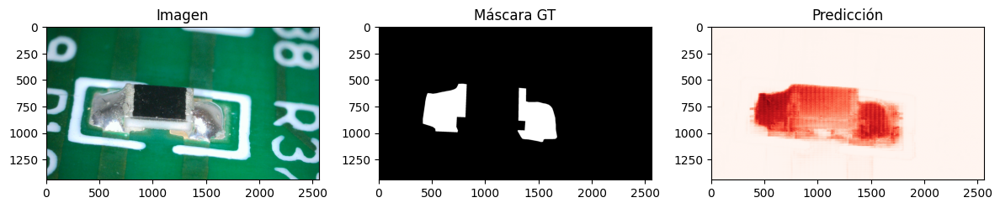

💾 Decoder guardado: sam_decoder_epoch1.pth

🔁 Epoch 2/20
  [Batch 0/14] Loss: 0.0161
  [Batch 10/14] Loss: 0.0090
✅ Epoch 2 finished. Avg Loss: 1.1812
📊 Métricas — IoU: 0.5510 | Dice: 0.7105 | Prec: 0.8274 | Rec: 0.6225


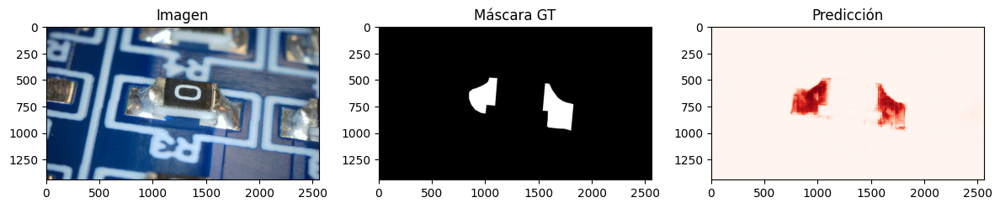

💾 Decoder guardado: sam_decoder_epoch2.pth

🔁 Epoch 3/20
  [Batch 0/14] Loss: 0.0188
  [Batch 10/14] Loss: 0.0173
✅ Epoch 3 finished. Avg Loss: 0.7596
📊 Métricas — IoU: 0.9361 | Dice: 0.9670 | Prec: 0.9743 | Rec: 0.9598


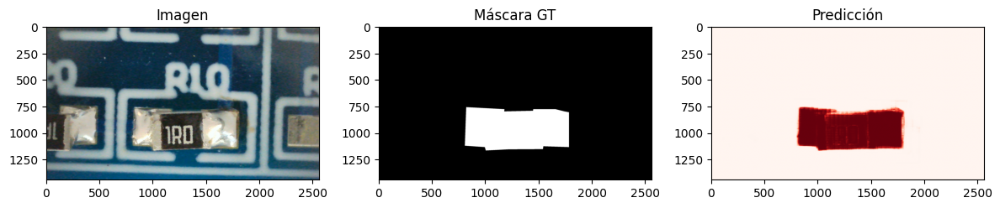

💾 Decoder guardado: sam_decoder_epoch3.pth

🔁 Epoch 4/20
  [Batch 0/14] Loss: 0.0356
  [Batch 10/14] Loss: 0.0422
✅ Epoch 4 finished. Avg Loss: 0.6148
📊 Métricas — IoU: 0.8580 | Dice: 0.9235 | Prec: 0.8924 | Rec: 0.9569


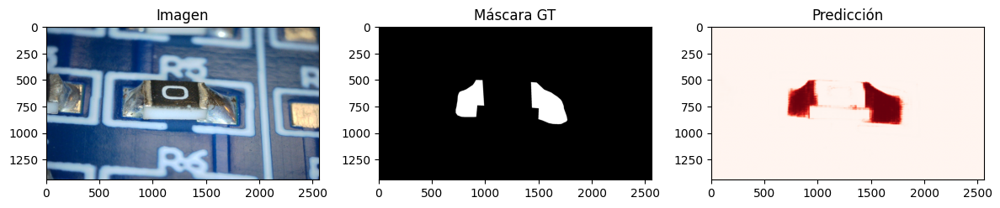

💾 Decoder guardado: sam_decoder_epoch4.pth

🔁 Epoch 5/20
  [Batch 0/14] Loss: 0.0176
  [Batch 10/14] Loss: 0.0120
✅ Epoch 5 finished. Avg Loss: 0.5404
📊 Métricas — IoU: 0.9346 | Dice: 0.9662 | Prec: 0.9370 | Rec: 0.9973


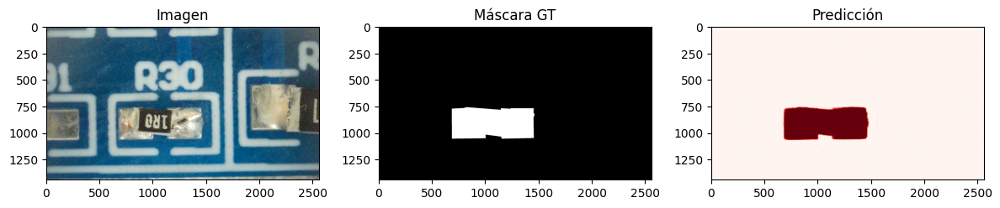

💾 Decoder guardado: sam_decoder_epoch5.pth

🔁 Epoch 6/20
  [Batch 0/14] Loss: 0.0068
  [Batch 10/14] Loss: 0.0487
✅ Epoch 6 finished. Avg Loss: 0.5009
📊 Métricas — IoU: 0.8431 | Dice: 0.9149 | Prec: 0.8895 | Rec: 0.9418


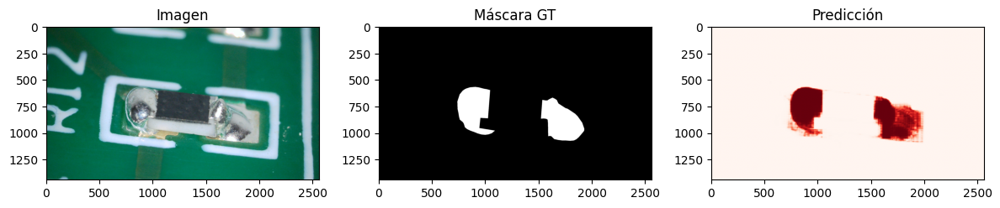

💾 Decoder guardado: sam_decoder_epoch6.pth

🔁 Epoch 7/20
  [Batch 0/14] Loss: 0.0309
  [Batch 10/14] Loss: 0.1237
✅ Epoch 7 finished. Avg Loss: 0.6546
📊 Métricas — IoU: 0.8202 | Dice: 0.9012 | Prec: 0.9407 | Rec: 0.8649


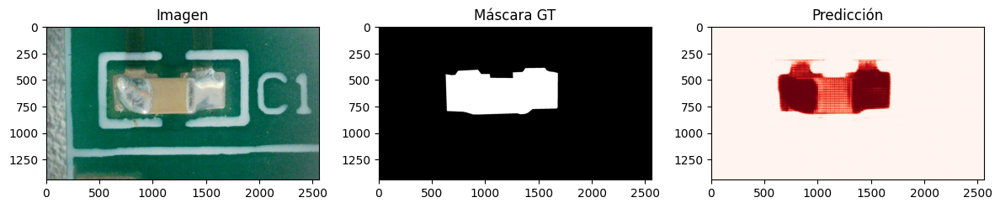

💾 Decoder guardado: sam_decoder_epoch7.pth

🔁 Epoch 8/20
  [Batch 0/14] Loss: 0.0193
  [Batch 10/14] Loss: 0.0146
✅ Epoch 8 finished. Avg Loss: 0.7426
📊 Métricas — IoU: 0.8504 | Dice: 0.9191 | Prec: 0.9086 | Rec: 0.9300


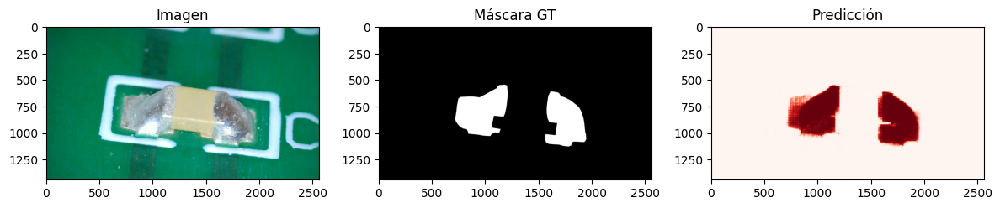

💾 Decoder guardado: sam_decoder_epoch8.pth

🔁 Epoch 9/20
  [Batch 0/14] Loss: 0.0090
  [Batch 10/14] Loss: 0.0225
✅ Epoch 9 finished. Avg Loss: 0.5460
📊 Métricas — IoU: 0.7349 | Dice: 0.8472 | Prec: 0.7744 | Rec: 0.9351


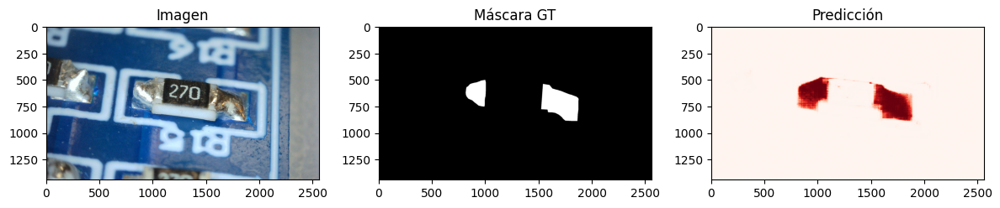

💾 Decoder guardado: sam_decoder_epoch9.pth

🔁 Epoch 10/20
  [Batch 0/14] Loss: 0.0130
  [Batch 10/14] Loss: 0.0208
✅ Epoch 10 finished. Avg Loss: 0.4654
📊 Métricas — IoU: 0.8972 | Dice: 0.9458 | Prec: 0.9732 | Rec: 0.9199


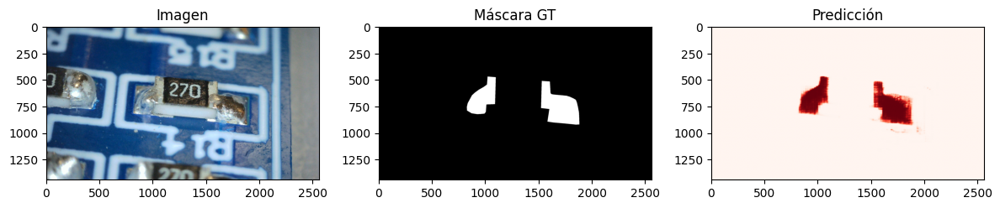

💾 Decoder guardado: sam_decoder_epoch10.pth

🔁 Epoch 11/20
  [Batch 0/14] Loss: 0.0246
  [Batch 10/14] Loss: 0.0101
✅ Epoch 11 finished. Avg Loss: 0.4377
📊 Métricas — IoU: 0.8014 | Dice: 0.8897 | Prec: 0.8505 | Rec: 0.9328


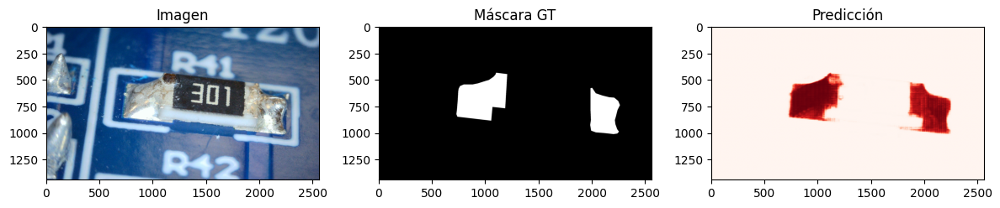

💾 Decoder guardado: sam_decoder_epoch11.pth

🔁 Epoch 12/20
  [Batch 0/14] Loss: 0.0052
  [Batch 10/14] Loss: 0.0062
✅ Epoch 12 finished. Avg Loss: 0.4255
📊 Métricas — IoU: 0.9606 | Dice: 0.9799 | Prec: 0.9863 | Rec: 0.9735


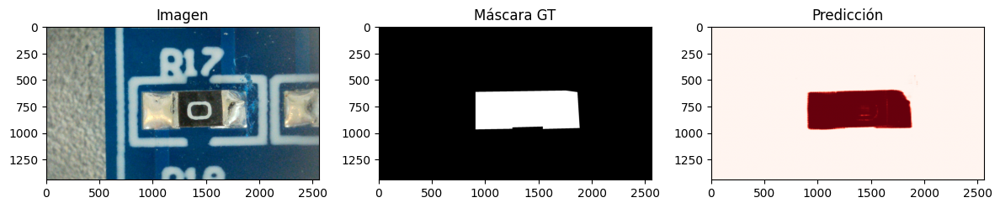

💾 Decoder guardado: sam_decoder_epoch12.pth

🔁 Epoch 13/20
  [Batch 0/14] Loss: 0.0291
  [Batch 10/14] Loss: 0.0119
✅ Epoch 13 finished. Avg Loss: 0.4178
📊 Métricas — IoU: 0.9605 | Dice: 0.9799 | Prec: 0.9654 | Rec: 0.9948


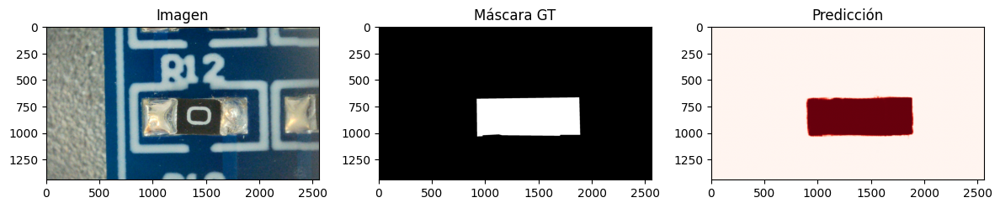

💾 Decoder guardado: sam_decoder_epoch13.pth

🔁 Epoch 14/20
  [Batch 0/14] Loss: 0.0134
  [Batch 10/14] Loss: 0.0197
✅ Epoch 14 finished. Avg Loss: 0.5802
📊 Métricas — IoU: 0.7962 | Dice: 0.8865 | Prec: 0.8628 | Rec: 0.9116


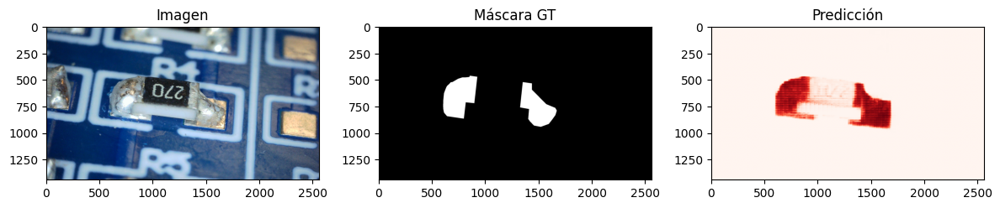

💾 Decoder guardado: sam_decoder_epoch14.pth

🔁 Epoch 15/20
  [Batch 0/14] Loss: 0.0748
  [Batch 10/14] Loss: 0.0078
✅ Epoch 15 finished. Avg Loss: 0.7238
📊 Métricas — IoU: 0.7823 | Dice: 0.8778 | Prec: 0.9100 | Rec: 0.8479


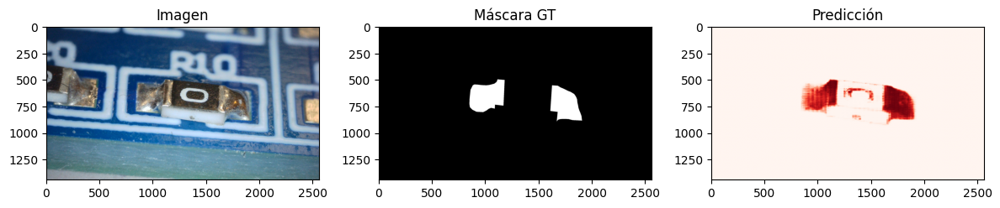

💾 Decoder guardado: sam_decoder_epoch15.pth

🔁 Epoch 16/20
  [Batch 0/14] Loss: 0.0142
  [Batch 10/14] Loss: 0.0071
✅ Epoch 16 finished. Avg Loss: 0.5101
📊 Métricas — IoU: 0.9192 | Dice: 0.9579 | Prec: 0.9564 | Rec: 0.9594


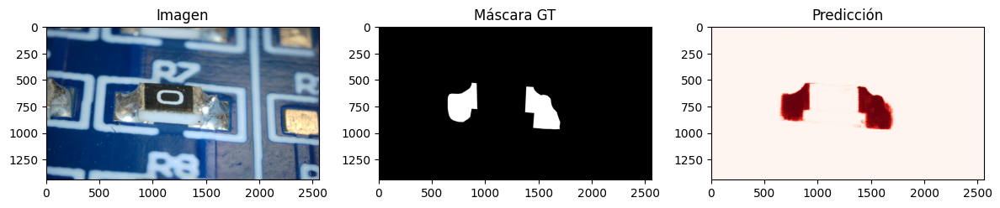

💾 Decoder guardado: sam_decoder_epoch16.pth

🔁 Epoch 17/20
  [Batch 0/14] Loss: 0.0078
  [Batch 10/14] Loss: 0.0067
✅ Epoch 17 finished. Avg Loss: 0.4296
📊 Métricas — IoU: 0.9825 | Dice: 0.9912 | Prec: 0.9957 | Rec: 0.9867


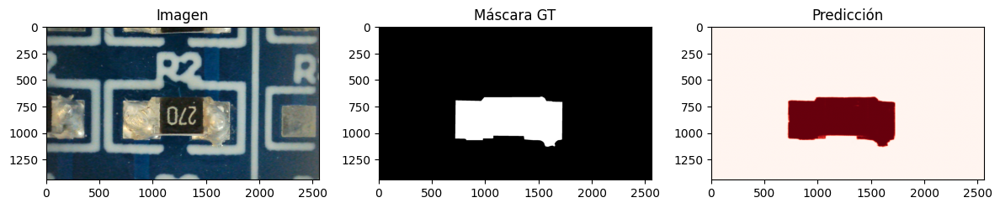

💾 Decoder guardado: sam_decoder_epoch17.pth

🔁 Epoch 18/20
  [Batch 0/14] Loss: 0.0050
  [Batch 10/14] Loss: 0.0087
✅ Epoch 18 finished. Avg Loss: 0.3998
📊 Métricas — IoU: 0.9698 | Dice: 0.9847 | Prec: 0.9814 | Rec: 0.9880


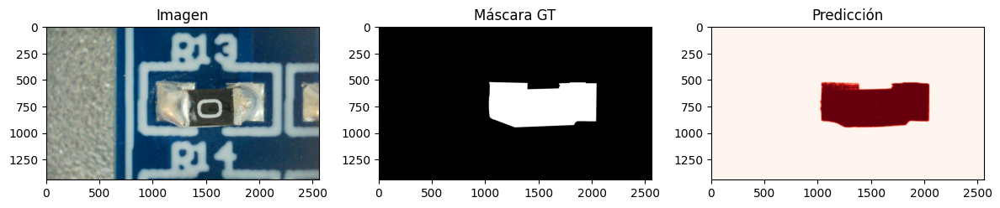

💾 Decoder guardado: sam_decoder_epoch18.pth

🔁 Epoch 19/20
  [Batch 0/14] Loss: 0.0089
  [Batch 10/14] Loss: 0.0243
✅ Epoch 19 finished. Avg Loss: 0.4011
📊 Métricas — IoU: 0.8132 | Dice: 0.8970 | Prec: 0.8445 | Rec: 0.9564


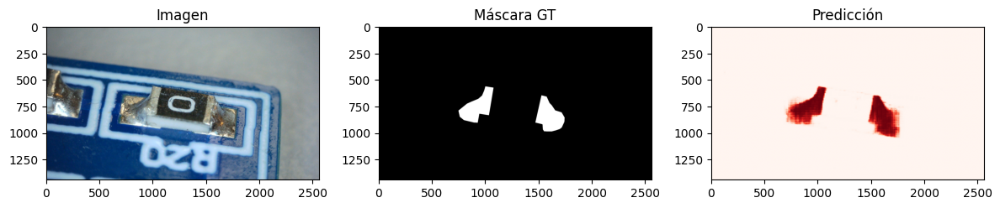

💾 Decoder guardado: sam_decoder_epoch19.pth

🔁 Epoch 20/20
  [Batch 0/14] Loss: 0.0045
  [Batch 10/14] Loss: 0.0283
✅ Epoch 20 finished. Avg Loss: 0.3774
📊 Métricas — IoU: 0.6713 | Dice: 0.8033 | Prec: 0.8229 | Rec: 0.7846


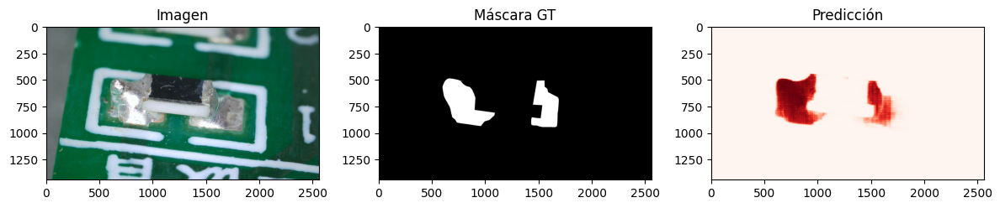

💾 Decoder guardado: sam_decoder_epoch20.pth
📁 Métricas guardadas en 'sam_decoder_metrics.csv'


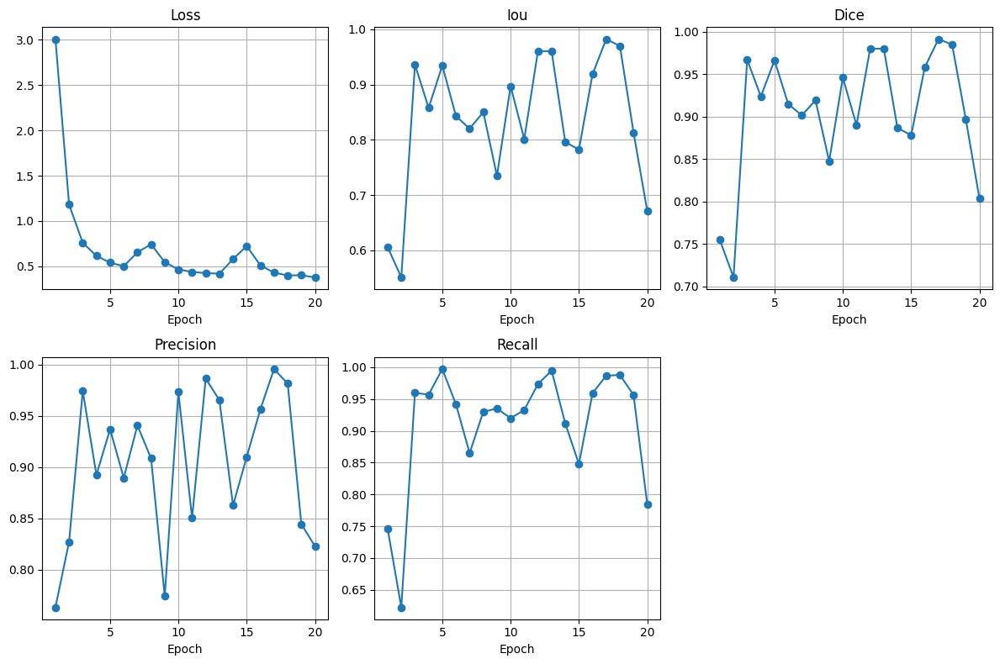

In [15]:
train_sam_decoder(sam, train_loader, epochs=20, lr=1e-4, device=DEVICE)



In [16]:
from segment_anything import SamPredictor
from torch.nn.functional import interpolate
import numpy as np
import matplotlib.pyplot as plt

def evaluate_sam_decoder(sam, dataloader, device="cuda"):
    sam.eval()
    predictor = SamPredictor(sam)
    all_metrics = []

    with torch.no_grad():
        for i, (images, masks_gt) in enumerate(dataloader):
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue

                point = coords.float().mean(dim=0)
                point_coords = np.array([[point[1].item(), point[0].item()]], dtype=np.float32)
                point_labels = np.array([1], dtype=np.int32)

                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                predictor.set_image(image_np)

                masks_pred, _, _ = predictor.predict(
                    point_coords=point_coords,
                    point_labels=point_labels,
                    multimask_output=False
                )

                pred = torch.tensor(masks_pred[0], dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
                mask_gt_resized = interpolate(mask_gt.unsqueeze(0), size=pred.shape[-2:], mode="bilinear")

                # === Métricas
                pred_bin = (pred > 0.5).float()
                gt_bin = (mask_gt_resized > 0.5).float()

                intersection = (pred_bin * gt_bin).sum().item()
                union = (pred_bin + gt_bin).clamp(0, 1).sum().item()
                pred_sum = pred_bin.sum().item()
                gt_sum = gt_bin.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                all_metrics.append([iou, dice, precision, recall])

    # === Promedios
    all_metrics = np.array(all_metrics)
    mean_iou = np.mean(all_metrics[:, 0])
    mean_dice = np.mean(all_metrics[:, 1])
    mean_prec = np.mean(all_metrics[:, 2])
    mean_rec = np.mean(all_metrics[:, 3])

    print("\n📊 Resultados promedio en validación:")
    print(f"IoU:  {mean_iou:.4f}")
    print(f"Dice: {mean_dice:.4f}")
    print(f"Prec: {mean_prec:.4f}")
    print(f"Rec:  {mean_rec:.4f}")



🔁 Epoch 1/5
  [Batch 0/343] Loss: 0.0058
  [Batch 10/343] Loss: 0.0170
  [Batch 20/343] Loss: 0.0235
  [Batch 30/343] Loss: 0.0048
  [Batch 40/343] Loss: 0.0119
  [Batch 50/343] Loss: 0.0062
  [Batch 60/343] Loss: 0.0063
  [Batch 70/343] Loss: 0.0303
  [Batch 80/343] Loss: 0.0197
  [Batch 90/343] Loss: 0.0401
  [Batch 100/343] Loss: 0.0271
  [Batch 110/343] Loss: 0.0058
  [Batch 120/343] Loss: 0.0170
  [Batch 130/343] Loss: 0.0134
  [Batch 140/343] Loss: 0.0057
  [Batch 150/343] Loss: 0.0150
  [Batch 160/343] Loss: 0.0246
  [Batch 170/343] Loss: 0.0074
  [Batch 180/343] Loss: 0.0173
  [Batch 190/343] Loss: 0.0148
  [Batch 200/343] Loss: 0.0221
  [Batch 210/343] Loss: 0.0263
  [Batch 220/343] Loss: 0.0144
  [Batch 230/343] Loss: 0.0045
  [Batch 240/343] Loss: 0.0212
  [Batch 250/343] Loss: 0.0110
  [Batch 260/343] Loss: 0.0457
  [Batch 270/343] Loss: 0.0042
  [Batch 280/343] Loss: 0.0226
  [Batch 290/343] Loss: 0.0078
  [Batch 300/343] Loss: 0.0203
  [Batch 310/343] Loss: 0.0075
  [Bat

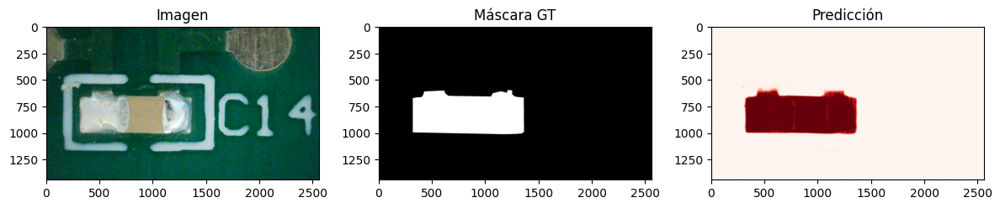

💾 Decoder guardado: sam_decoder_epoch1.pth

🔁 Epoch 2/5
  [Batch 0/343] Loss: 0.0326
  [Batch 10/343] Loss: 0.0080
  [Batch 20/343] Loss: 0.0069
  [Batch 30/343] Loss: 0.0043
  [Batch 40/343] Loss: 0.0283
  [Batch 50/343] Loss: 0.0201
  [Batch 60/343] Loss: 0.0077
  [Batch 70/343] Loss: 0.0150
  [Batch 80/343] Loss: 0.0191
  [Batch 90/343] Loss: 0.0342
  [Batch 100/343] Loss: 0.0037
  [Batch 110/343] Loss: 0.0095
  [Batch 120/343] Loss: 0.0120
  [Batch 130/343] Loss: 0.0104
  [Batch 140/343] Loss: 0.0062
  [Batch 150/343] Loss: 0.0193
  [Batch 160/343] Loss: 0.0060
  [Batch 170/343] Loss: 0.0058
  [Batch 180/343] Loss: 0.0045
  [Batch 190/343] Loss: 0.0056
  [Batch 200/343] Loss: 0.0130
  [Batch 210/343] Loss: 0.0141
  [Batch 220/343] Loss: 0.0108
  [Batch 230/343] Loss: 0.0274
  [Batch 240/343] Loss: 0.0077
  [Batch 250/343] Loss: 0.0156
  [Batch 260/343] Loss: 0.0175
  [Batch 270/343] Loss: 0.0139
  [Batch 280/343] Loss: 0.0091
  [Batch 290/343] Loss: 0.0035
  [Batch 300/343] Loss: 0

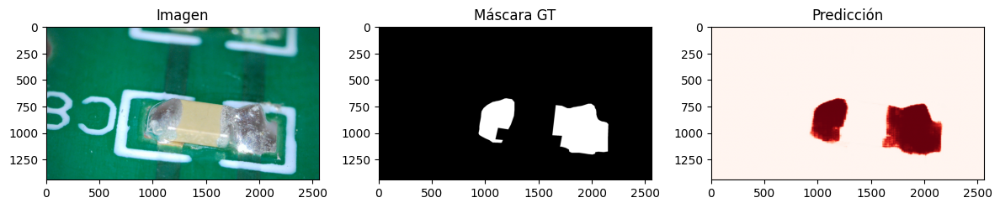

💾 Decoder guardado: sam_decoder_epoch2.pth

🔁 Epoch 3/5
  [Batch 0/343] Loss: 0.0049
  [Batch 10/343] Loss: 0.0228
  [Batch 20/343] Loss: 0.0220
  [Batch 30/343] Loss: 0.0040
  [Batch 40/343] Loss: 0.0329
  [Batch 50/343] Loss: 0.0078
  [Batch 60/343] Loss: 0.0088
  [Batch 70/343] Loss: 0.0062
  [Batch 80/343] Loss: 0.0085
  [Batch 90/343] Loss: 0.0057
  [Batch 100/343] Loss: 0.0211
  [Batch 110/343] Loss: 0.0152
  [Batch 120/343] Loss: 0.0036
  [Batch 130/343] Loss: 0.0087
  [Batch 140/343] Loss: 0.0134
  [Batch 150/343] Loss: 0.0132
  [Batch 160/343] Loss: 0.0121
  [Batch 170/343] Loss: 0.0308
  [Batch 180/343] Loss: 0.0134
  [Batch 190/343] Loss: 0.0168
  [Batch 200/343] Loss: 0.0086
  [Batch 210/343] Loss: 0.0098
  [Batch 220/343] Loss: 0.0300
  [Batch 230/343] Loss: 0.0123
  [Batch 240/343] Loss: 0.0138
  [Batch 250/343] Loss: 0.0106
  [Batch 260/343] Loss: 0.0290
  [Batch 270/343] Loss: 0.0683
  [Batch 280/343] Loss: 0.0285
  [Batch 290/343] Loss: 0.0647
  [Batch 300/343] Loss: 0

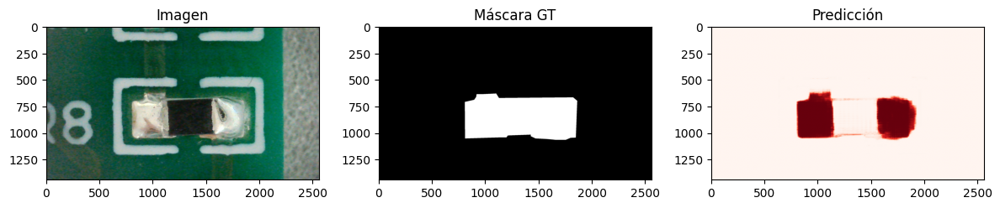

💾 Decoder guardado: sam_decoder_epoch3.pth

🔁 Epoch 4/5
  [Batch 0/343] Loss: 0.0238
  [Batch 10/343] Loss: 0.0060
  [Batch 20/343] Loss: 0.0125
  [Batch 30/343] Loss: 0.0150
  [Batch 40/343] Loss: 0.0375
  [Batch 50/343] Loss: 0.0259
  [Batch 60/343] Loss: 0.0053
  [Batch 70/343] Loss: 0.0042
  [Batch 80/343] Loss: 0.0251
  [Batch 90/343] Loss: 0.0046
  [Batch 100/343] Loss: 0.0093
  [Batch 110/343] Loss: 0.0164
  [Batch 120/343] Loss: 0.0105
  [Batch 130/343] Loss: 0.0550
  [Batch 140/343] Loss: 0.0146
  [Batch 150/343] Loss: 0.0151
  [Batch 160/343] Loss: 0.0206
  [Batch 170/343] Loss: 0.0210
  [Batch 180/343] Loss: 0.0162
  [Batch 190/343] Loss: 0.0136
  [Batch 200/343] Loss: 0.0105
  [Batch 210/343] Loss: 0.0457
  [Batch 220/343] Loss: 0.0245
  [Batch 230/343] Loss: 0.0057
  [Batch 240/343] Loss: 0.0097
  [Batch 250/343] Loss: 0.0175
  [Batch 260/343] Loss: 0.0135
  [Batch 270/343] Loss: 0.0070
  [Batch 280/343] Loss: 0.0198
  [Batch 290/343] Loss: 0.0094
  [Batch 300/343] Loss: 0

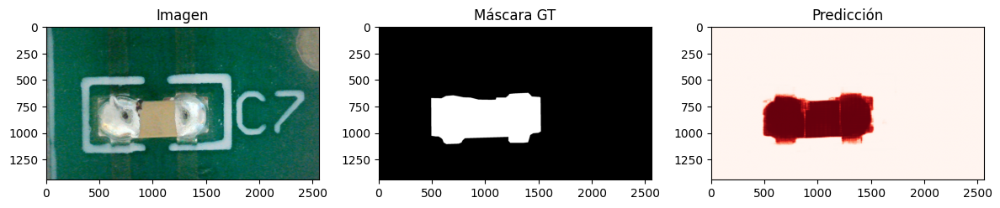

💾 Decoder guardado: sam_decoder_epoch4.pth

🔁 Epoch 5/5
  [Batch 0/343] Loss: 0.0191
  [Batch 10/343] Loss: 0.0181
  [Batch 20/343] Loss: 0.0105
  [Batch 30/343] Loss: 0.0079
  [Batch 40/343] Loss: 0.0217
  [Batch 50/343] Loss: 0.0204
  [Batch 60/343] Loss: 0.0090
  [Batch 70/343] Loss: 0.0146
  [Batch 80/343] Loss: 0.0148
  [Batch 90/343] Loss: 0.0095
  [Batch 100/343] Loss: 0.0043
  [Batch 110/343] Loss: 0.0053
  [Batch 120/343] Loss: 0.0273
  [Batch 130/343] Loss: 0.0077
  [Batch 140/343] Loss: 0.0044
  [Batch 150/343] Loss: 0.0036
  [Batch 160/343] Loss: 0.0169
  [Batch 170/343] Loss: 0.0061
  [Batch 180/343] Loss: 0.0039
  [Batch 190/343] Loss: 0.0116
  [Batch 200/343] Loss: 0.0166
  [Batch 210/343] Loss: 0.0080
  [Batch 220/343] Loss: 0.0120
  [Batch 230/343] Loss: 0.0333
  [Batch 240/343] Loss: 0.0128
  [Batch 250/343] Loss: 0.0094
  [Batch 260/343] Loss: 0.0214
  [Batch 270/343] Loss: 0.0175
  [Batch 280/343] Loss: 0.0186
  [Batch 290/343] Loss: 0.0047
  [Batch 300/343] Loss: 0

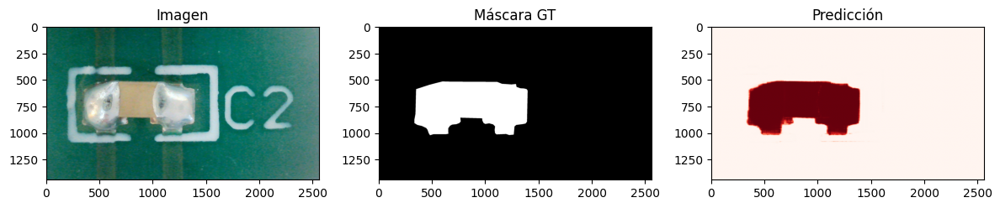

💾 Decoder guardado: sam_decoder_epoch5.pth
📁 Métricas guardadas en 'sam_decoder_metrics.csv'


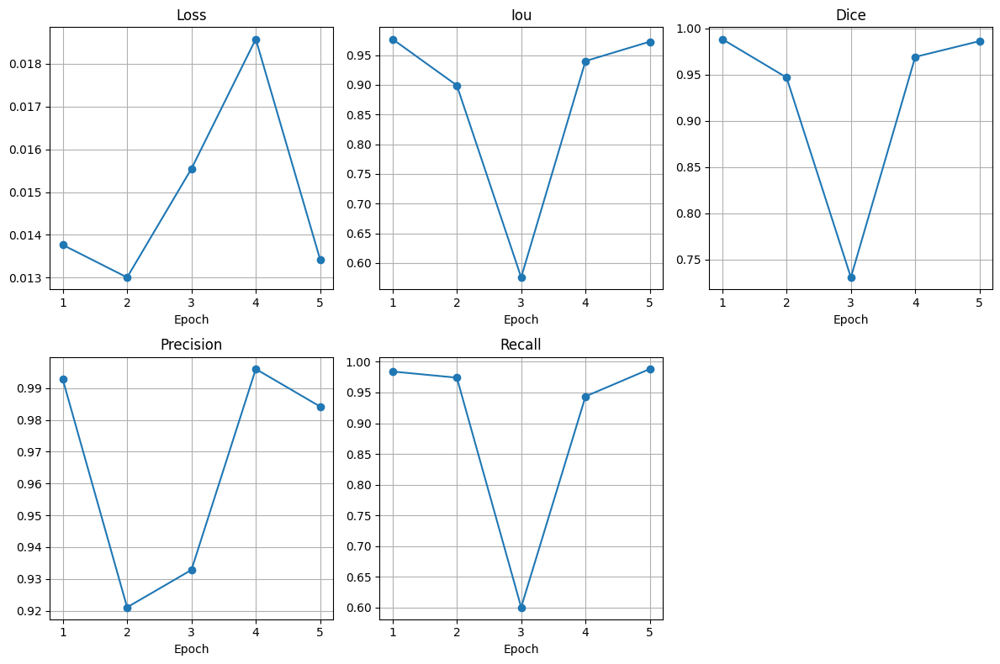


📊 Resultados promedio en validación:
IoU:  0.4487
Dice: 0.5758
Prec: 0.7990
Rec:  0.4876


In [17]:
from torch.utils.data import DataLoader, random_split

# 🔁 1. Dividir el dataset en entrenamiento y validación (80/20)
total_size = len(dataset)
val_size = int(0.2 * total_size)
train_size = total_size - val_size

train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

# ✅ 2. Entrenar el decoder
train_sam_decoder(sam, train_loader, epochs=5, lr=1e-4, device=DEVICE)

# 🧪 3. Evaluar el decoder entrenado
evaluate_sam_decoder(sam, val_loader, device=DEVICE)



In [18]:
print(f"🔢 Total imágenes en validación: {len(val_loader.dataset)}")


🔢 Total imágenes en validación: 85


In [19]:
import torch
import numpy as np
from tqdm import tqdm
from segment_anything import SamPredictor
from torch.nn.functional import interpolate

def evaluate_sam_pretrained(sam, dataloader, device="cuda"):
    sam.eval()
    sam.to(device)

    iou_list, dice_list, precision_list, recall_list = [], [], [], []

    with torch.no_grad():
        for images, masks_gt in tqdm(dataloader, desc="Evaluando SAM preentrenado"):
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_np = images[b].permute(1, 2, 0).cpu().numpy()
                mask_gt = masks_gt[b]

                # Crear prompt (centroide)
                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue
                point = coords.float().mean(dim=0)
                point_coords = np.array([[point[1].item(), point[0].item()]], dtype=np.float32)
                point_labels = np.array([1], dtype=np.int32)

                predictor = SamPredictor(sam)
                predictor.set_image(image_np)

                masks_pred, _, _ = predictor.predict(
                    point_coords=point_coords,
                    point_labels=point_labels,
                    multimask_output=False
                )

                mask_pred_tensor = torch.tensor(masks_pred[0], dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)
                mask_gt_resized = interpolate(mask_gt.unsqueeze(0), size=mask_pred_tensor.shape[-2:], mode="bilinear")

                pred_bin = (mask_pred_tensor > 0.5).float()
                gt_bin = (mask_gt_resized > 0.5).float()

                intersection = (pred_bin * gt_bin).sum().item()
                union = (pred_bin + gt_bin).clamp(0, 1).sum().item()
                pred_sum = pred_bin.sum().item()
                gt_sum = gt_bin.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                iou_list.append(iou)
                dice_list.append(dice)
                precision_list.append(precision)
                recall_list.append(recall)

    print("\n📊 Resultados promedio sin fine-tuning:")
    print(f"IoU:  {np.mean(iou_list):.4f}")
    print(f"Dice: {np.mean(dice_list):.4f}")
    print(f"Prec: {np.mean(precision_list):.4f}")
    print(f"Rec:  {np.mean(recall_list):.4f}")


In [20]:
evaluate_sam_pretrained(sam, val_loader, device=DEVICE)

Evaluando SAM preentrenado: 100%|██████████| 85/85 [00:37<00:00,  2.27it/s]


📊 Resultados promedio sin fine-tuning:
IoU:  0.4487
Dice: 0.5758
Prec: 0.7990
Rec:  0.4876


📊 Evaluando SAM preentrenado...


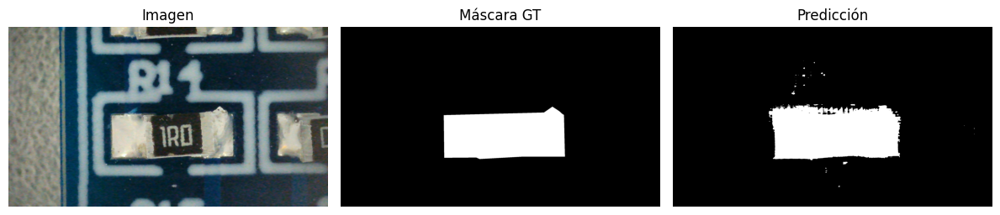

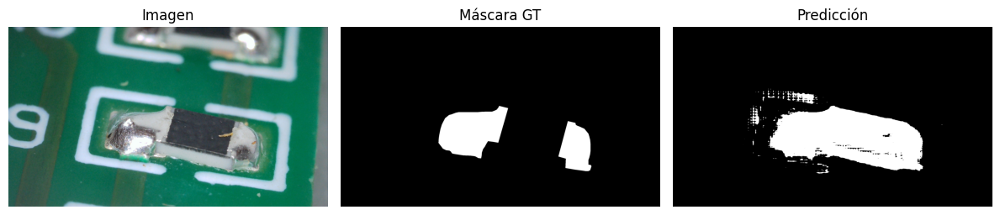

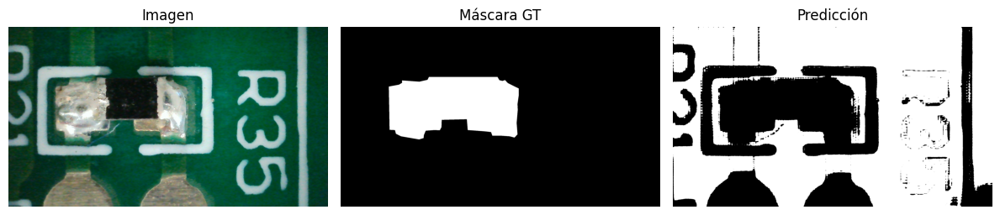

Resultados SIN fine-tuning: {'IoU': 0.24475567282727106, 'Dice': 0.32614314974328773, 'Prec': 0.2634251139327318, 'Rec': 0.4927572372598716, 'Images': 85}
📈 Evaluando SAM con fine-tuning...


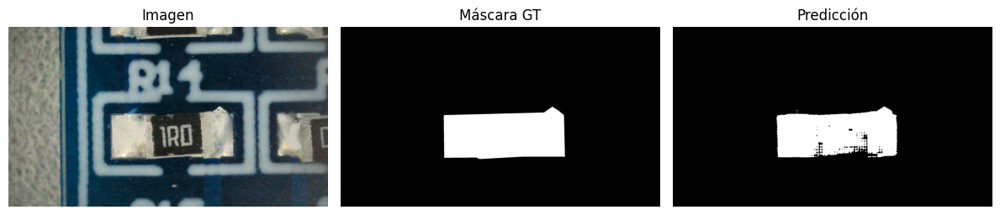

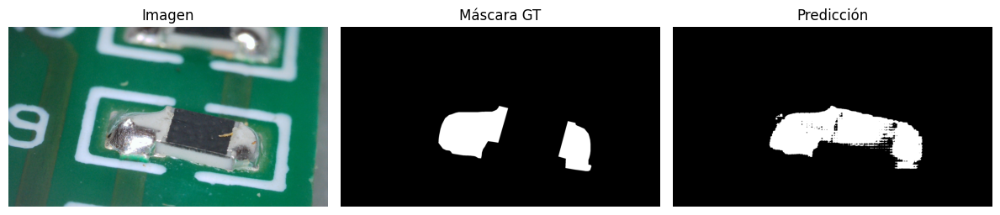

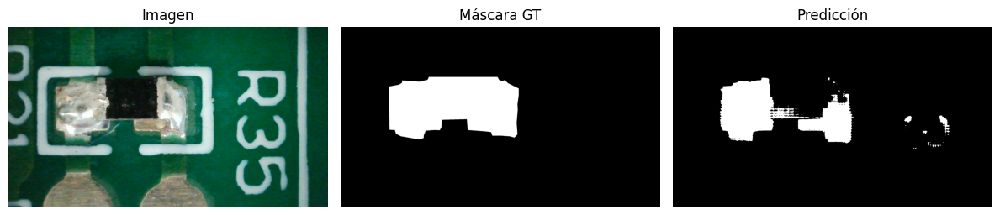

Resultados CON fine-tuning: {'IoU': 0.7279719221519411, 'Dice': 0.8229614948374473, 'Prec': 0.9300571018217957, 'Rec': 0.7737957894736422, 'Images': 85}


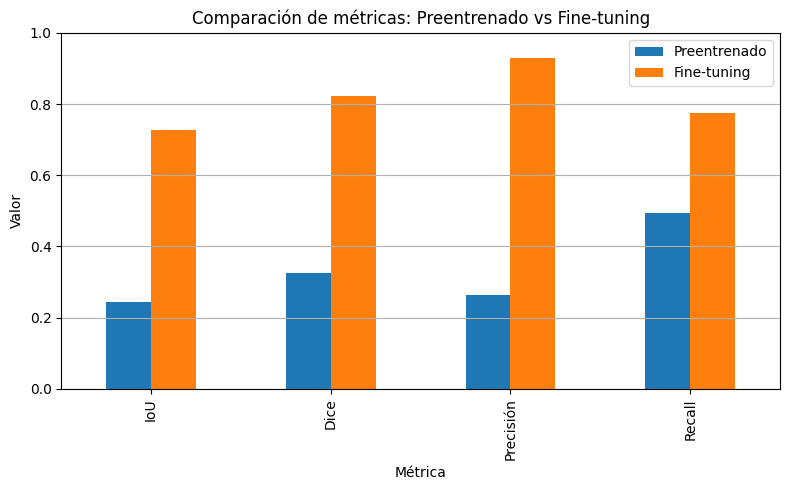

In [21]:
import torch
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from PIL import Image
from segment_anything import sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide

# === CONFIGURACIÓN ===
sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"
fine_tuned_decoder_path = "sam_decoder_epoch17.pth"
device = "cuda" if torch.cuda.is_available() else "cpu"

# === EVALUACIÓN ===
def evaluar_sam(sam_model, dataloader, device="cuda", visualizar=False, max_visualizaciones=3):
    sam_model.eval()
    sam_model.to(device)

    total_iou = total_dice = total_precision = total_recall = total_imgs = 0
    visualizados = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue

                point = coords.float().mean(dim=0)
                point_coords = torch.tensor([[point[1].item(), point[0].item()]], dtype=torch.float32)
                point_labels = torch.tensor([1], dtype=torch.int)

                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                image_np_resized = np.array(Image.fromarray((image_np * 255).astype(np.uint8)).resize((1024, 1024)))
                input_image_torch = torch.as_tensor(image_np_resized.transpose(2, 0, 1)).float().to(device) / 255.0
                input_image_torch = input_image_torch.unsqueeze(0)

                image_embedding = sam_model.image_encoder(input_image_torch)
                coords_torch = point_coords.unsqueeze(0).to(device)
                labels_torch = point_labels.unsqueeze(0).to(device)

                sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                    points=(coords_torch, labels_torch),
                    boxes=None,
                    masks=None,
                )

                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_up = torch.nn.functional.interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")
                mask_pred_bin = (mask_pred_up > 0.5).float()

                intersection = (mask_pred_bin * mask_gt).sum().item()
                union = ((mask_pred_bin + mask_gt).clamp(0, 1)).sum().item()
                pred_sum = mask_pred_bin.sum().item()
                gt_sum = mask_gt.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                total_iou += iou
                total_dice += dice
                total_precision += precision
                total_recall += recall
                total_imgs += 1

                # === Visualización opcional ===
                if visualizar and visualizados < max_visualizaciones:
                    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
                    axs[0].imshow(image_np)
                    axs[0].set_title("Imagen")
                    axs[1].imshow(mask_gt[0].cpu(), cmap="gray")
                    axs[1].set_title("Máscara GT")
                    axs[2].imshow(mask_pred_bin[0][0].cpu(), cmap="gray")
                    axs[2].set_title("Predicción")
                    for ax in axs:
                        ax.axis("off")
                    plt.tight_layout()
                    plt.show()
                    visualizados += 1

    return {
        "IoU": total_iou / total_imgs,
        "Dice": total_dice / total_imgs,
        "Prec": total_precision / total_imgs,
        "Rec": total_recall / total_imgs,
        "Images": total_imgs
    }

# === EVALUACIÓN PREENTRENADO ===
sam_pretrained = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
print("📊 Evaluando SAM preentrenado...")
result_pre = evaluar_sam(sam_pretrained, val_loader, device=device, visualizar=True)
print("Resultados SIN fine-tuning:", result_pre)

# 🔁 Liberar memoria
del sam_pretrained
torch.cuda.empty_cache()

# === EVALUACIÓN FINE-TUNED ===
sam_finetuned = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_finetuned.mask_decoder.load_state_dict(torch.load(fine_tuned_decoder_path, map_location=device))
print("📈 Evaluando SAM con fine-tuning...")
result_fine = evaluar_sam(sam_finetuned, val_loader, device=device, visualizar=True)
print("Resultados CON fine-tuning:", result_fine)

# === 📊 Comparativa gráfica ===
df_compare = pd.DataFrame({
    "Métrica": ["IoU", "Dice", "Precisión", "Recall"],
    "Preentrenado": [result_pre["IoU"], result_pre["Dice"], result_pre["Prec"], result_pre["Rec"]],
    "Fine-tuning": [result_fine["IoU"], result_fine["Dice"], result_fine["Prec"], result_fine["Rec"]]
})

df_compare.set_index("Métrica").plot(kind="bar", figsize=(8, 5))
plt.title("Comparación de métricas: Preentrenado vs Fine-tuning")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.tight_layout()
plt.show()



📊 Resultados SIN fine-tuning: {'IoU': 0.24475567282727106, 'Dice': 0.32614314974328773, 'Prec': 0.2634251139327318, 'Rec': 0.4927572372598716, 'Images': 85}
📈 Resultados CON fine-tuning: {'IoU': 0.7279719221519411, 'Dice': 0.8229614948374473, 'Prec': 0.9300571018217957, 'Rec': 0.7737957894736422, 'Images': 85}


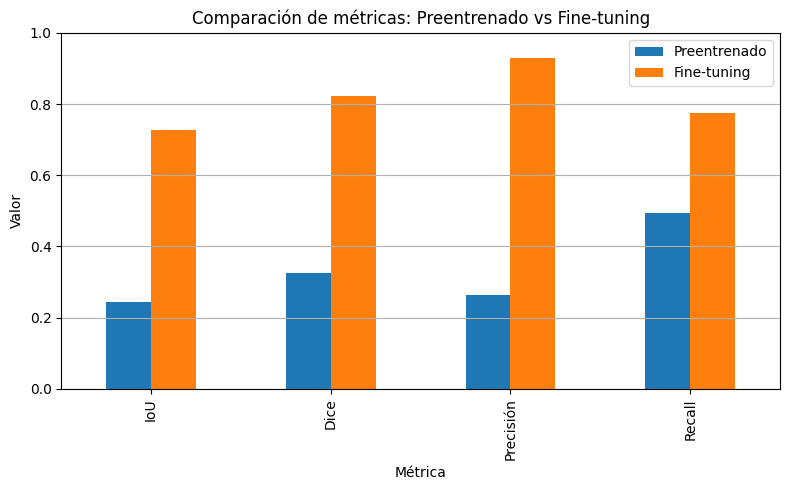

In [22]:
import torch
import matplotlib.pyplot as plt
import pandas as pd
from segment_anything import sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide
import numpy as np
import time
import os

# === CONFIGURACIÓN ===
sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"  # checkpoint preentrenado
fine_tuned_decoder_path = "sam_decoder_epoch17.pth"    # decoder fine-tuned
device = "cuda" if torch.cuda.is_available() else "cpu"

# === FUNCIÓN DE EVALUACIÓN ===
def evaluar_sam(sam_model, dataloader, device="cuda"):
    sam_model.eval()
    sam_model.to(device)

    total_iou = 0
    total_dice = 0
    total_precision = 0
    total_recall = 0
    total_imgs = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue

                point = coords.float().mean(dim=0)
                point_coords = torch.tensor([[point[1].item(), point[0].item()]], dtype=torch.float32)
                point_labels = torch.tensor([1], dtype=torch.int)

                # === Procesar imagen y redimensionar a 1024x1024 ===
                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                image_np_resized = np.array(Image.fromarray((image_np * 255).astype(np.uint8)).resize((1024, 1024)))
                input_image_torch = torch.as_tensor(image_np_resized.transpose(2, 0, 1)).float().to(device) / 255.0
                input_image_torch = input_image_torch.unsqueeze(0)

                image_embedding = sam_model.image_encoder(input_image_torch)
                coords_torch = point_coords.unsqueeze(0).to(device)
                labels_torch = point_labels.unsqueeze(0).to(device)

                sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                    points=(coords_torch, labels_torch),
                    boxes=None,
                    masks=None,
                )

                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_up = torch.nn.functional.interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")
                mask_pred_bin = (mask_pred_up > 0.5).float()

                # === Métricas
                intersection = (mask_pred_bin * mask_gt).sum().item()
                union = ((mask_pred_bin + mask_gt).clamp(0, 1)).sum().item()
                pred_sum = mask_pred_bin.sum().item()
                gt_sum = mask_gt.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                total_iou += iou
                total_dice += dice
                total_precision += precision
                total_recall += recall
                total_imgs += 1

    return {
        "IoU": total_iou / total_imgs,
        "Dice": total_dice / total_imgs,
        "Prec": total_precision / total_imgs,
        "Rec": total_recall / total_imgs,
        "Images": total_imgs
    }


# === 1️⃣ Evaluación sin fine-tuning ===
sam_pretrained = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
result_pre = evaluar_sam(sam_pretrained, val_loader, device=device)
print("📊 Resultados SIN fine-tuning:", result_pre)

# === 2️⃣ Evaluación con fine-tuning ===
sam_finetuned = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_finetuned.mask_decoder.load_state_dict(torch.load(fine_tuned_decoder_path, map_location=device))
result_fine = evaluar_sam(sam_finetuned, val_loader, device=device)
print("📈 Resultados CON fine-tuning:", result_fine)

# === 📊 Comparativa gráfica ===
df_compare = pd.DataFrame({
    "Métrica": ["IoU", "Dice", "Precisión", "Recall"],
    "Preentrenado": [result_pre["IoU"], result_pre["Dice"], result_pre["Prec"], result_pre["Rec"]],
    "Fine-tuning": [result_fine["IoU"], result_fine["Dice"], result_fine["Prec"], result_fine["Rec"]]
})

df_compare.set_index("Métrica").plot(kind="bar", figsize=(8, 5))
plt.title("Comparación de métricas: Preentrenado vs Fine-tuning")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.tight_layout()
plt.show()



In [23]:
def resumen_modelo(model, name="SAM"):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"📦 {name}: {trainable:,} / {total:,} parámetros entrenables")

# Verifica ambos modelos
resumen_modelo(sam_pretrained, "SAM Preentrenado")
resumen_modelo(sam_finetuned, "SAM Fine-tuned")


📦 SAM Preentrenado: 93,735,472 / 93,735,472 parámetros entrenables
📦 SAM Fine-tuned: 93,735,472 / 93,735,472 parámetros entrenables


In [49]:
def evaluar_sam(sam_model, dataloader, device="cuda", tipo_prompt="point", visualizar=False, max_visualizaciones=3):
    from matplotlib.patches import Rectangle

    sam_model.eval()
    sam_model.to(device)

    total_iou = total_dice = total_precision = total_recall = total_imgs = 0
    visualizados = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                point_coords, point_labels, box = generar_prompts(mask_gt, tipo=tipo_prompt)
                if point_coords is not None:
                    point_coords_vis = point_coords.clone().cpu()
                    point_coords = point_coords.unsqueeze(0).to(device)
                    point_labels = point_labels.unsqueeze(0).to(device)
                else:
                    point_coords_vis = None
                    point_coords = point_labels = None

                if box is not None:
                    box_vis = box.clone().cpu()
                    box = box.to(device)
                else:
                    box_vis = None

                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                image_np_resized = np.array(Image.fromarray((image_np * 255).astype(np.uint8)).resize((1024, 1024)))
                input_image_torch = torch.as_tensor(image_np_resized.transpose(2, 0, 1)).float().to(device) / 255.0
                input_image_torch = input_image_torch.unsqueeze(0)

                image_embedding = sam_model.image_encoder(input_image_torch)

                # ✅ Corrección aquí
                if point_coords is not None and point_labels is not None:
                    points = (point_coords, point_labels)
                else:
                    points = None

                sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                    points=points,
                    boxes=box,
                    masks=None,
                )

                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_up = torch.nn.functional.interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")
                mask_pred_bin = (mask_pred_up > 0.5).float()

                intersection = (mask_pred_bin * mask_gt).sum().item()
                union = ((mask_pred_bin + mask_gt).clamp(0, 1)).sum().item()
                pred_sum = mask_pred_bin.sum().item()
                gt_sum = mask_gt.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                total_iou += iou
                total_dice += dice
                total_precision += precision
                total_recall += recall
                total_imgs += 1

                if visualizar and visualizados < max_visualizaciones:
                    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
                    axs[0].imshow(image_np)
                    axs[0].set_title("Imagen + Prompt")

                    if point_coords_vis is not None:
                        for x, y in point_coords_vis:
                            axs[0].scatter(x.item(), y.item(), color="lime", s=40)

                    if box_vis is not None:
                        x0, y0, x1, y1 = box_vis[0]
                        axs[0].add_patch(Rectangle((x0.item(), y0.item()), (x1 - x0).item(), (y1 - y0).item(),
                                                   edgecolor="red", facecolor="none", lw=2))

                    axs[1].imshow(mask_gt[0].cpu(), cmap="gray")
                    axs[1].set_title("Máscara GT")
                    axs[2].imshow(mask_pred_bin[0][0].cpu(), cmap="gray")
                    axs[2].set_title("Predicción")
                    for ax in axs:
                        ax.axis("off")
                    plt.tight_layout()
                    plt.show()
                    visualizados += 1

    return {
        "IoU": total_iou / total_imgs,
        "Dice": total_dice / total_imgs,
        "Prec": total_precision / total_imgs,
        "Rec": total_recall / total_imgs,
        "Images": total_imgs
    }


def evaluar_por_prompt(sam_model, dataloader, tipos_prompt=["point", "multi_point", "box", "box_point"], device="cuda", visualizar=False, max_visualizaciones=2):
    resultados = {}

    for tipo in tipos_prompt:
        print(f"\n📌 Evaluando con prompt: {tipo}")
        res = evaluar_sam(
            sam_model,
            dataloader,
            device=device,
            tipo_prompt=tipo,
            visualizar=visualizar,
            max_visualizaciones=max_visualizaciones
        )
        resultados[tipo] = res
        print(f"→ IoU:   {res['IoU']:.4f}")
        print(f"→ Dice:  {res['Dice']:.4f}")
        print(f"→ Prec:  {res['Prec']:.4f}")
        print(f"→ Rec:   {res['Rec']:.4f}")

    return resultados



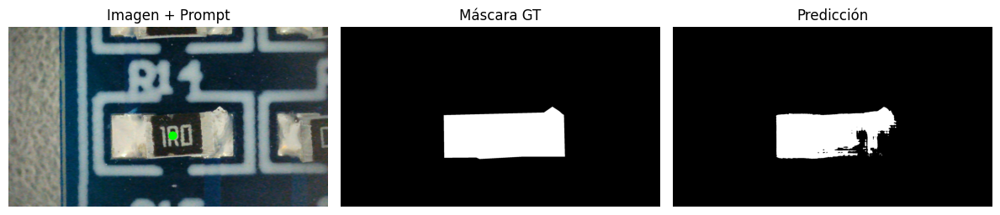

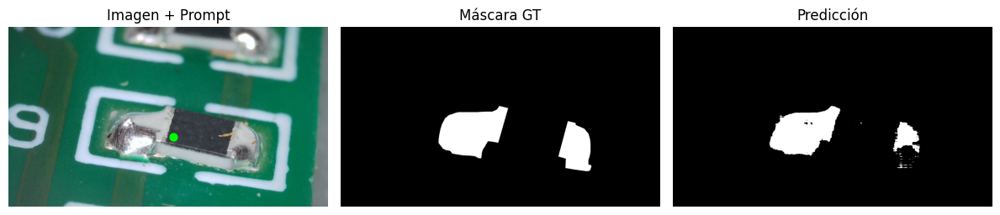

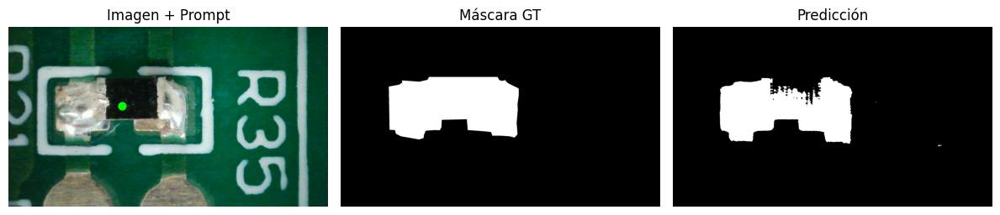

In [47]:
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))
result_finetuned = evaluar_sam(sam, val_loader, device=device, tipo_prompt="point", visualizar=True)


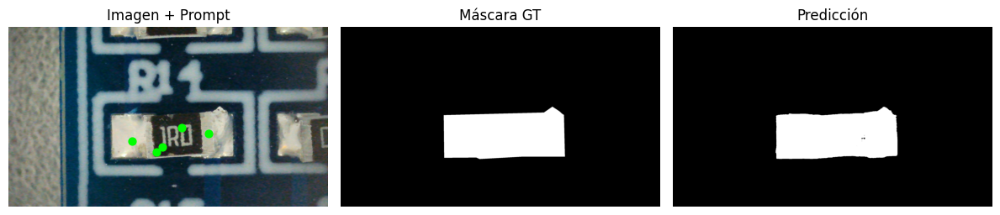

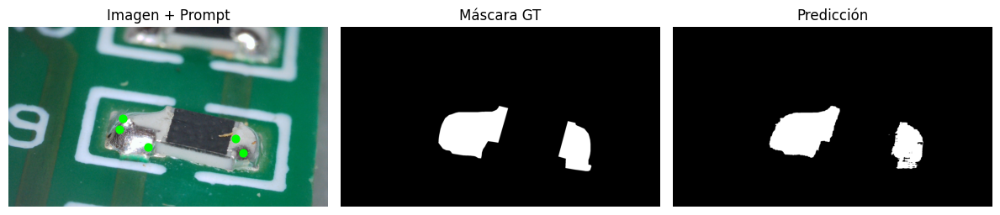

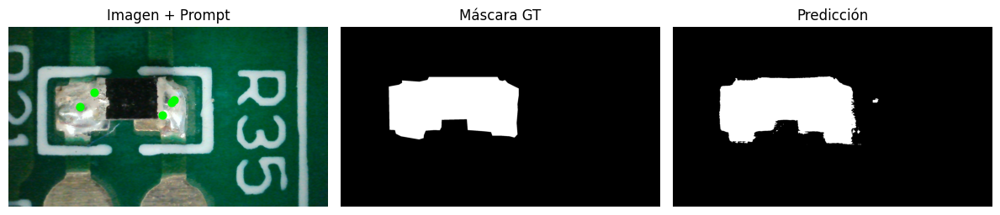

In [42]:
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))
result_finetuned = evaluar_sam(sam, val_loader, device=device, tipo_prompt="multi_point", visualizar=True)

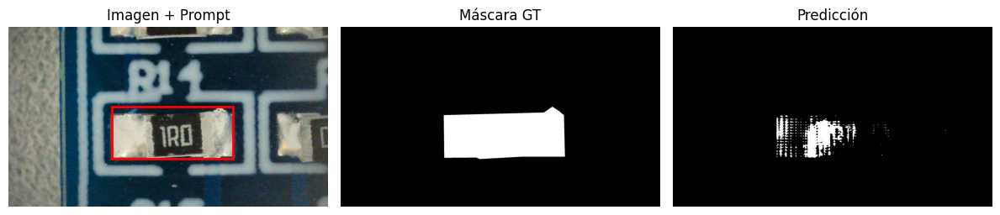

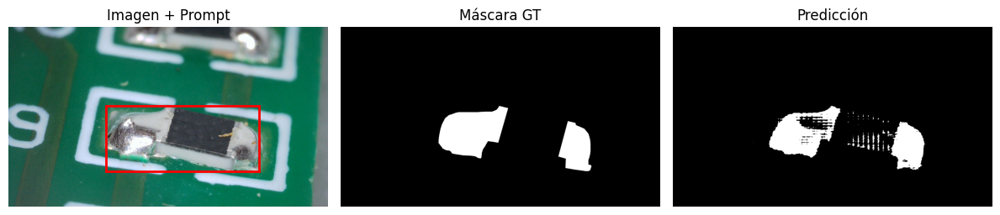

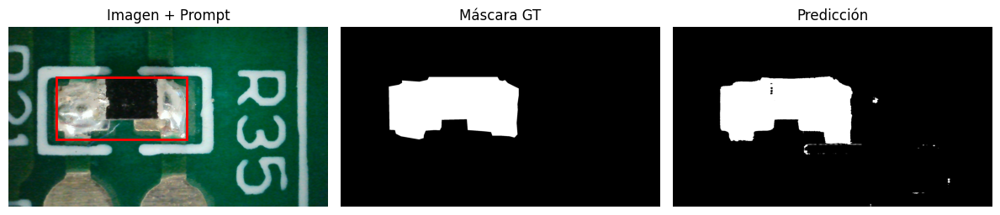

In [43]:
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))
result_finetuned = evaluar_sam(sam, val_loader, device=device, tipo_prompt="box", visualizar=True)

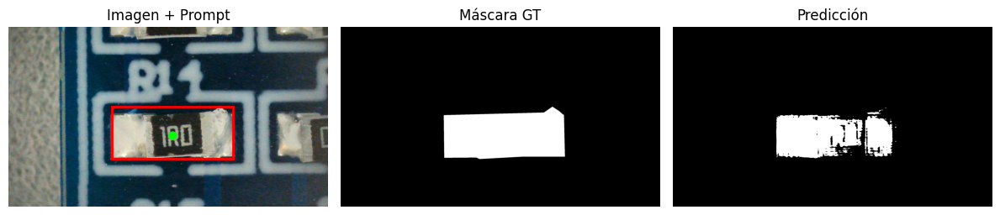

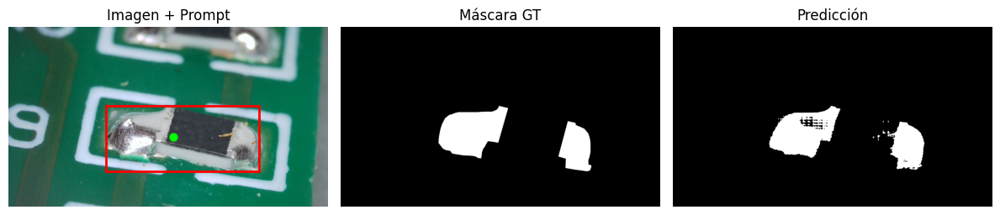

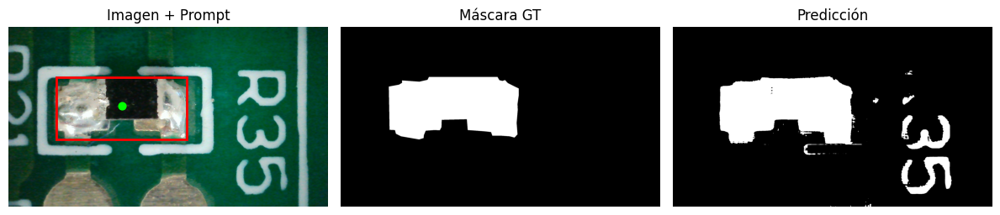

In [28]:
from segment_anything import sam_model_registry

sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"
decoder_path = "sam_decoder_epoch17.pth"  # Usa tu ruta real

sam_model = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_model.mask_decoder.load_state_dict(torch.load(decoder_path, map_location=device))

result = evaluar_sam(sam_model, val_loader, device=device, tipo_prompt="box_point", visualizar=True)


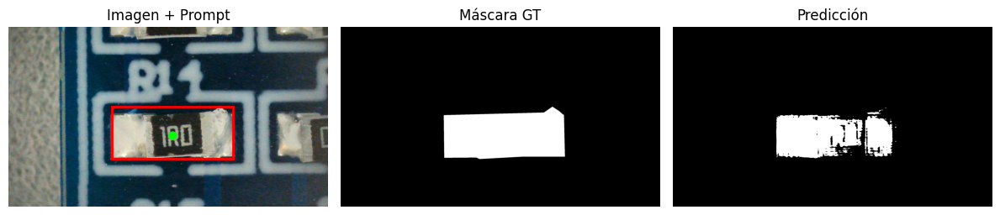

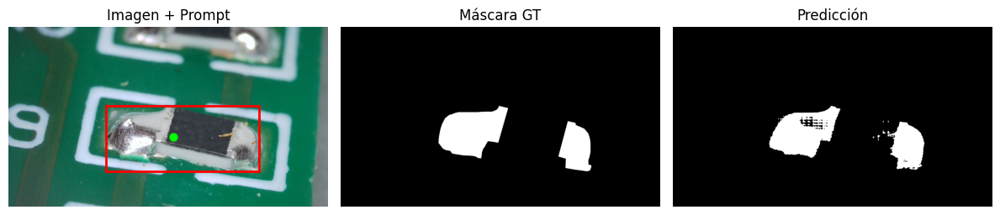

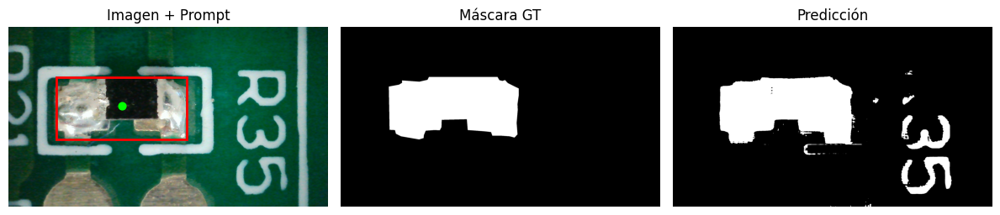

In [29]:
result = evaluar_sam(sam_model, val_loader, device=device, tipo_prompt="box_point", visualizar=True)



📌 Evaluando con prompt: point


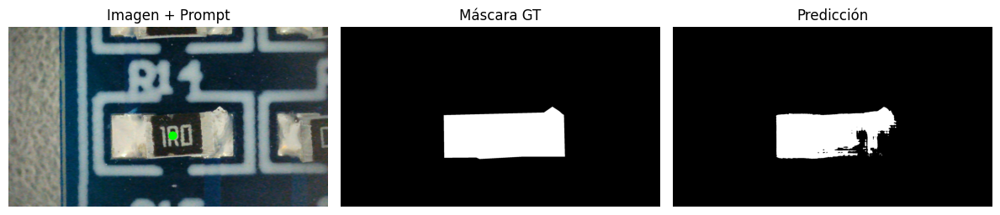

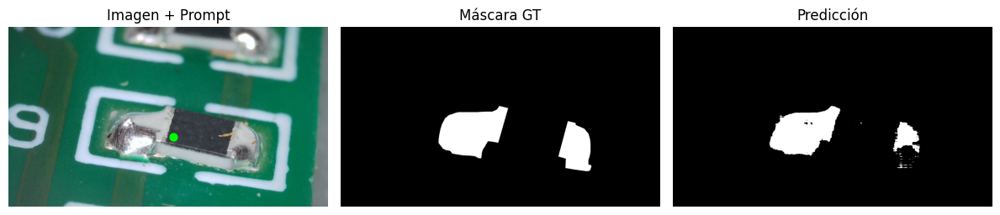

→ IoU:   0.8613
→ Dice:  0.9218
→ Prec:  0.9503
→ Rec:   0.9019

📌 Evaluando con prompt: multi_point


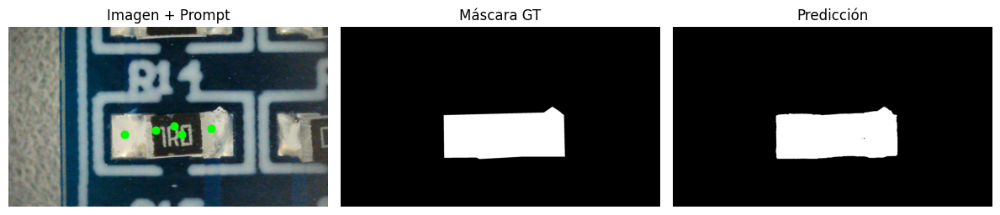

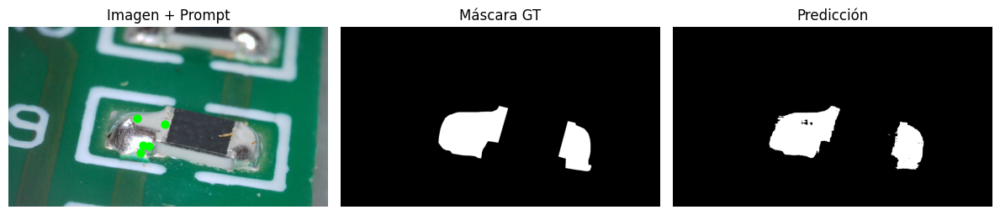

→ IoU:   0.8830
→ Dice:  0.9341
→ Prec:  0.9395
→ Rec:   0.9317

📌 Evaluando con prompt: box


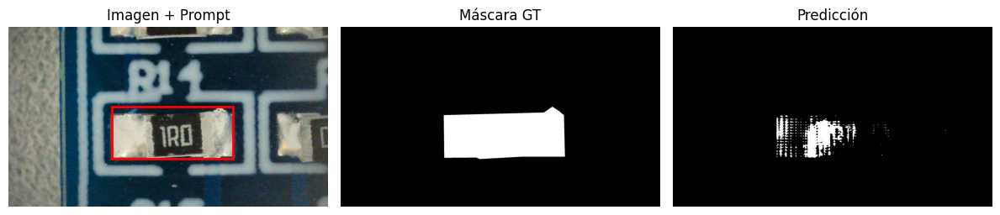

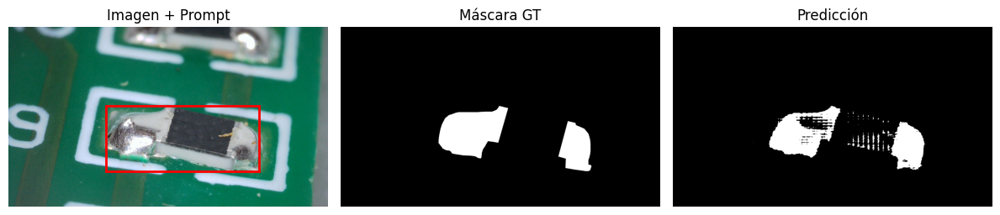

→ IoU:   0.7255
→ Dice:  0.8123
→ Prec:  0.8755
→ Rec:   0.8102

📌 Evaluando con prompt: box_point


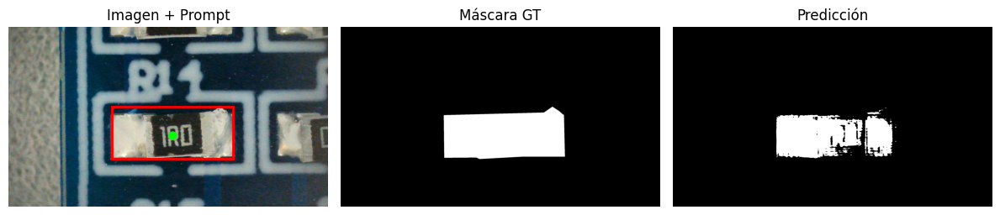

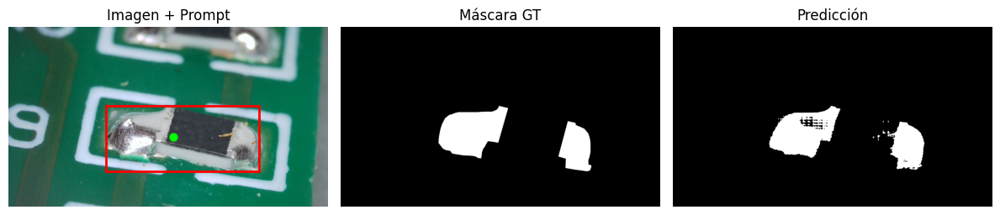

→ IoU:   0.8225
→ Dice:  0.8936
→ Prec:  0.8882
→ Rec:   0.9205

📊 Tabla comparativa de métricas:

                IoU    Dice    Prec     Rec
point        0.8613  0.9218  0.9503  0.9019
multi_point  0.8830  0.9341  0.9395  0.9317
box          0.7255  0.8123  0.8755  0.8102
box_point    0.8225  0.8936  0.8882  0.9205


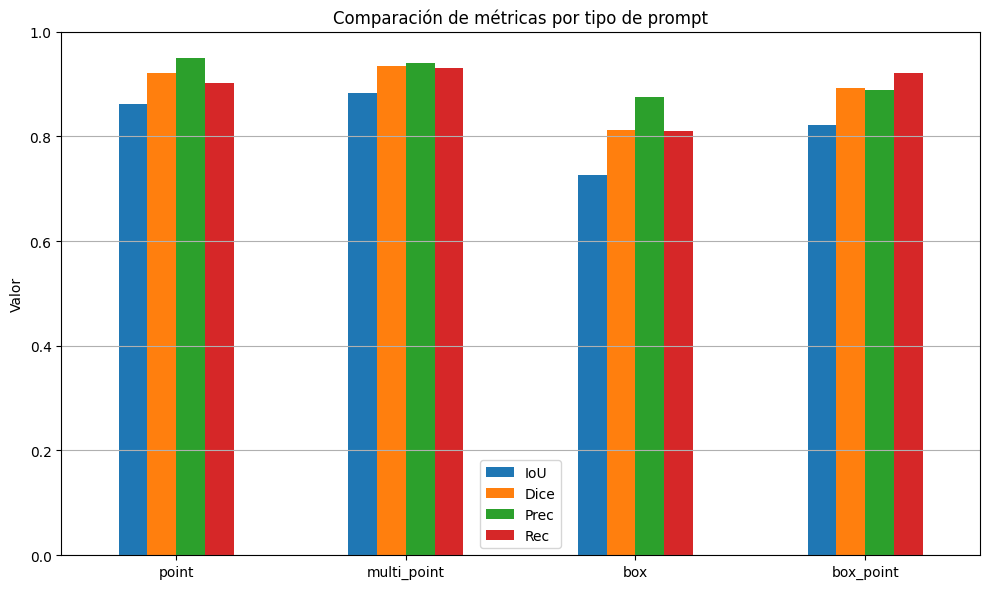

In [50]:
# === Uso ===
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))

resultados_por_prompt = evaluar_por_prompt(sam, val_loader, device=device, visualizar=True)

# === Visualización gráfica ===
import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame(resultados_por_prompt).T[["IoU", "Dice", "Prec", "Rec"]]
print("\n📊 Tabla comparativa de métricas:\n")
print(df.round(4))

df.plot(kind="bar", figsize=(10, 6))
plt.title("Comparación de métricas por tipo de prompt")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


📌 Evaluando con prompt: point


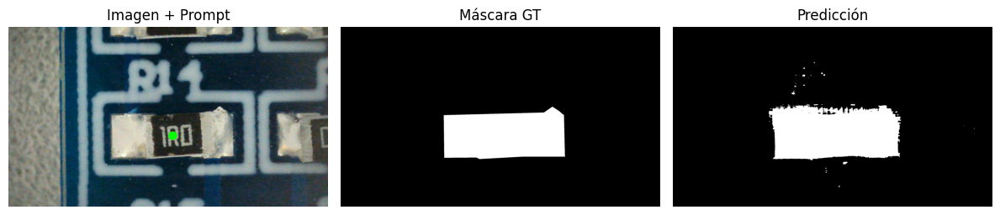

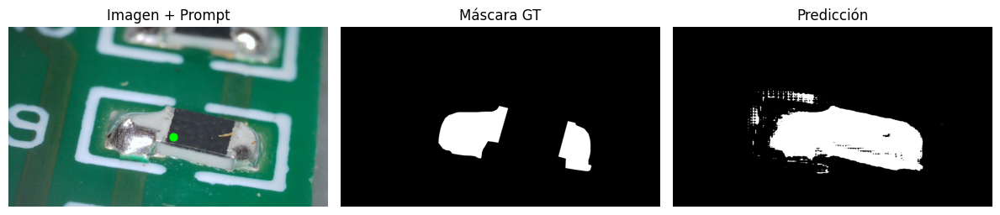

→ IoU:   0.2448
→ Dice:  0.3261
→ Prec:  0.2634
→ Rec:   0.4928

📌 Evaluando con prompt: multi_point


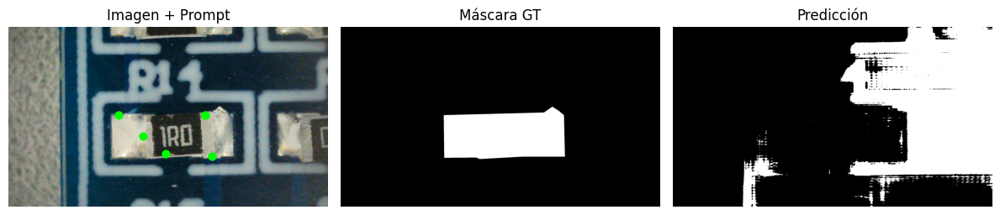

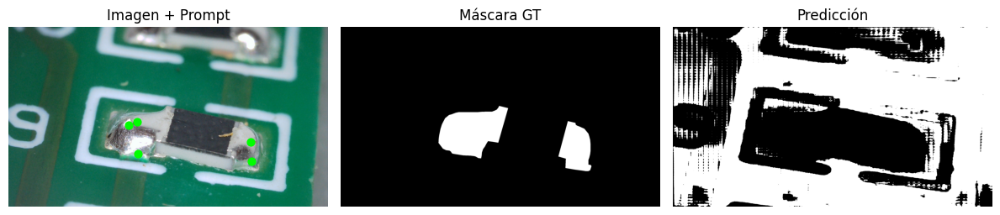

→ IoU:   0.0546
→ Dice:  0.0846
→ Prec:  0.0603
→ Rec:   0.2023

📌 Evaluando con prompt: box


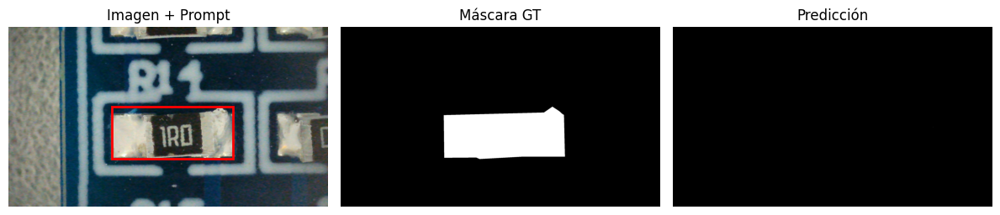

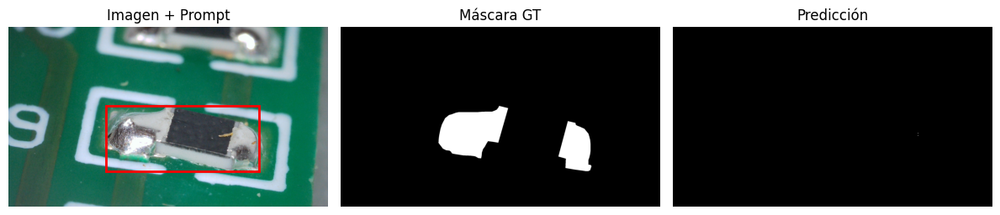

→ IoU:   0.0070
→ Dice:  0.0122
→ Prec:  0.2984
→ Rec:   0.0071

📌 Evaluando con prompt: box_point


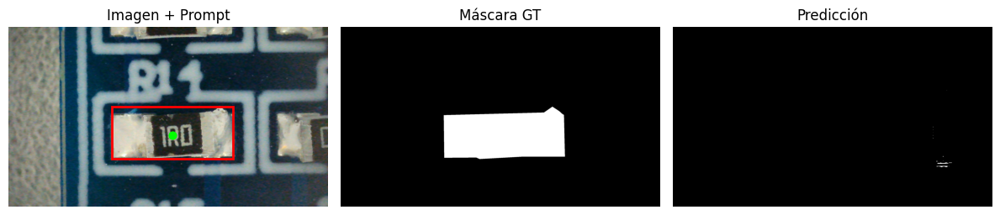

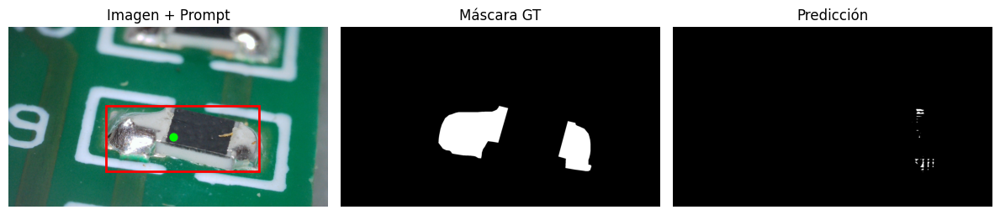

→ IoU:   0.0158
→ Dice:  0.0263
→ Prec:  0.1703
→ Rec:   0.0189

📊 Tabla comparativa de métricas (SAM sin fine-tuning):

                IoU    Dice    Prec     Rec
point        0.2448  0.3261  0.2634  0.4928
multi_point  0.0546  0.0846  0.0603  0.2023
box          0.0070  0.0122  0.2984  0.0071
box_point    0.0158  0.0263  0.1703  0.0189


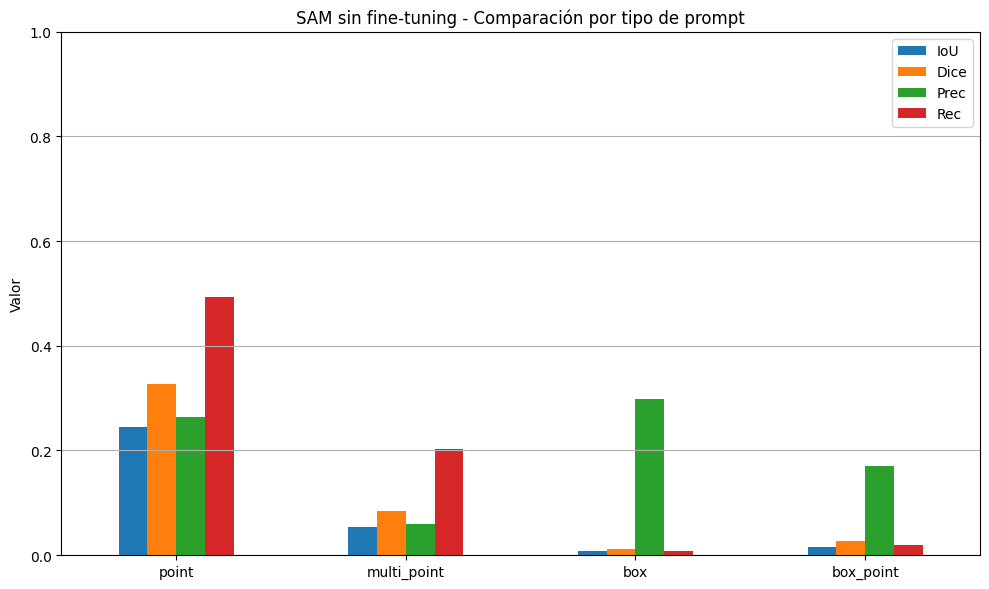

In [51]:
# === Modelo preentrenado (SIN cargar decoder fine-tuned) ===
sam_pretrained = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)

# === Evaluación con distintos tipos de prompt ===
resultados_por_prompt_pre = evaluar_por_prompt(sam_pretrained, val_loader, device=device, visualizar=True)

# === Visualización de métricas ===
import pandas as pd
import matplotlib.pyplot as plt

df_pre = pd.DataFrame(resultados_por_prompt_pre).T[["IoU", "Dice", "Prec", "Rec"]]
print("\n📊 Tabla comparativa de métricas (SAM sin fine-tuning):\n")
print(df_pre.round(4))

df_pre.plot(kind="bar", figsize=(10, 6))
plt.title("SAM sin fine-tuning - Comparación por tipo de prompt")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
